In [37]:
import sys; sys.path.insert(0, '../src')
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [40]:
import pandas as pd
import stumpy
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as dates
from matplotlib.patches import Rectangle
import datetime as dt
import twopass
import changepoints
import tests

plt.rcParams["figure.figsize"] = [8, 3]  # width, height
plt.rcParams["figure.dpi"] = 300
plt.rcParams["font.family"] = "serif"
plt.rcParams['xtick.direction'] = 'in'
ids = changepoints.getIds()
eventLog = changepoints.readEventLog()
machineSet = list(changepoints.getMachines(eventLog))

In [20]:
def metricsMachine(machine, pen, window, algo, graph = False, start = True, end = True, method="Window", mode="dynamic", t=1000, debug=False):
    resbyday, logbyday = tests.checkpointsMatrixOrDTW(
      name = machine, 
      eventlog = eventLog, 
      ids = ids, 
      influx = False, 
      pen = pen, 
      window = window, 
      algo = algo, 
      interval = "5s", 
      template = "dba", 
      trimming = True, 
      firstpassmethod=method,
      mode=mode,
      t=t,
      debug = debug
    )
    res = []
    for x in resbyday:
        daywiseX = []
        for y in x:
            if(start): daywiseX.append(y[0])
            if(end): daywiseX.append(y[1])
        res.append(daywiseX)

    metrics = tests.calculateMetrics(res, logbyday, start = start, end = end, customMargin=60)

    labels = list(map(lambda x: str(x["day"]), metrics))
    precision = list(map(lambda x: x["TP"] / (x["TP"] + x["FP"]) if x["TP"] != 0 else 0, metrics))
    recall = list(map(lambda x: x["TP"] / (x["TP"] + x["FN"]) if x["TP"] != 0 else 0, metrics))
    f1score = [2 * (p * r) / (p+r) if p != 0 else 0 for (p,r) in zip(precision, recall)]
    alldeviations = []
    for day in metrics:
        alldeviations += day["deviation"]

    if(graph):

        x = np.arange(len(labels))  # the label locations
        width = 0.25  # the width of the bars

        fig, ax = plt.subplots()
        rects1 = ax.bar(x - width, precision, width, label='Prec.')
        rects2 = ax.bar(x + width, recall, width, label='Recall')
        rects3 = ax.bar(x, f1score, width, label="F1")

        # Add some text for labels, title and custom x-axis tick labels, etc.
        ax.set_ylabel('Scores')
        ax.set_title('Scores by Day for ' + machine + " on " + algo)
        ax.set_xticks(x)
        ax.set_xticklabels(labels)
        ax.legend()

        ax.bar_label(rects1, padding=3)
        ax.bar_label(rects2, padding=3)
        ax.bar_label(rects3, padding=3)

        fig.tight_layout()
        #plt.savefig("outrvt/metrics" + machine + mode + method + algo + ".png")
        plt.show()

        ## Histogram
        avgdev = sum(alldeviations)/len(alldeviations)

        plt.suptitle('Changepoint detection deviation, avg=' + str(avgdev))
        plt.xlabel('Time')
        plt.ylabel('Count')
        plt.hist(alldeviations, bins=30)
        #plt.savefig("outrvt/deviation" + machine + mode + method + algo + ".png")
        plt.show()

    return metrics, precision, recall, f1score, alldeviations

# Threshold Mode Testing Curve

In [ ]:
import json

good_machines = ["HaasMM2", "Lasebox", "HaasST10", "cleanlaser", "Kasto"]
windows = [35, 20, 35, 35, 20]
algos = ["Window", "Binseg", "Botup"]

oldres = {}

with open("out/res.json", "r") as infile:
  oldres = json.load(infile)

res = {}

for algo in algos:
  res[algo] = []

for ix in range(len(good_machines)):
  machine = good_machines[ix]
  window = windows[ix]
  f1sperAlgo = []

  for algo in algos:
    #Iterate over threshold
    for t in range(50):
      print("IT " + str(t*100))
      try:
        metrics, precision, recall, f1score, alldeviations = metricsMachine(machine,oldres[algo][ix][3],window,"dtw",False,True,True,algo,"statict",t*100)
        res[algo].append((t*100, (metrics, precision, recall, f1score, alldeviations)))
      except:
        print("something went wrong")
        res[algo].append((t*100, (0,0,0,0,0)))
    print(algo + "DONE")

with open("outrvt/res.json", "w") as outfile:
  json.dump(res, outfile)


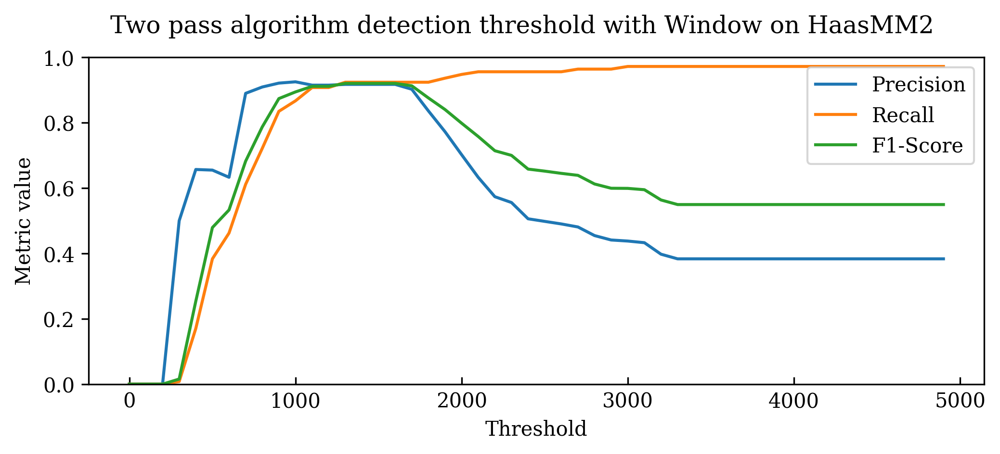

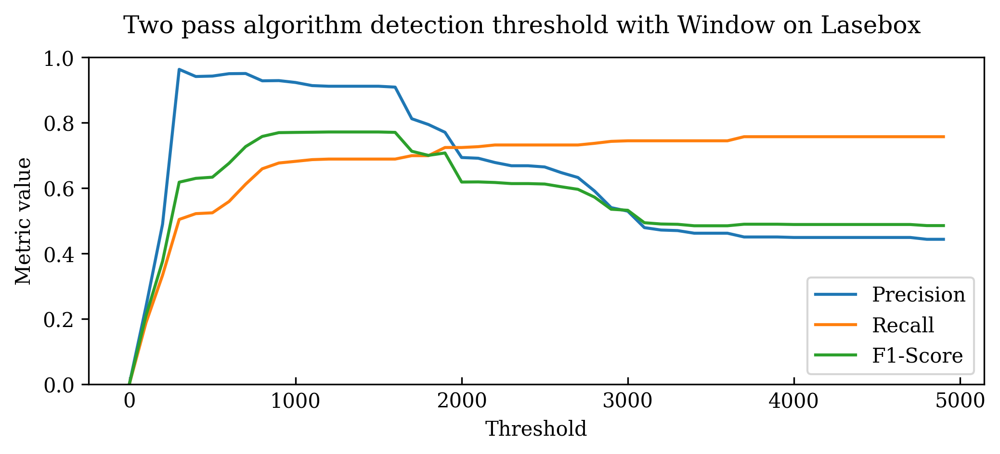

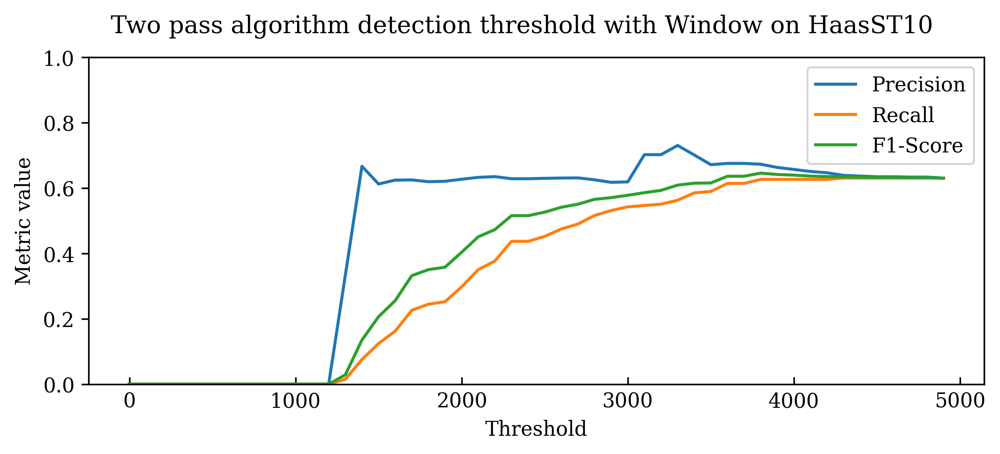

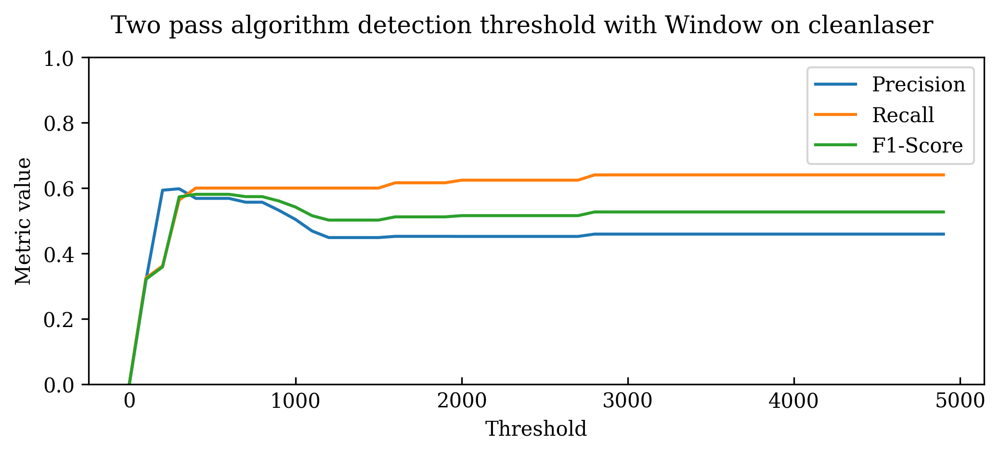

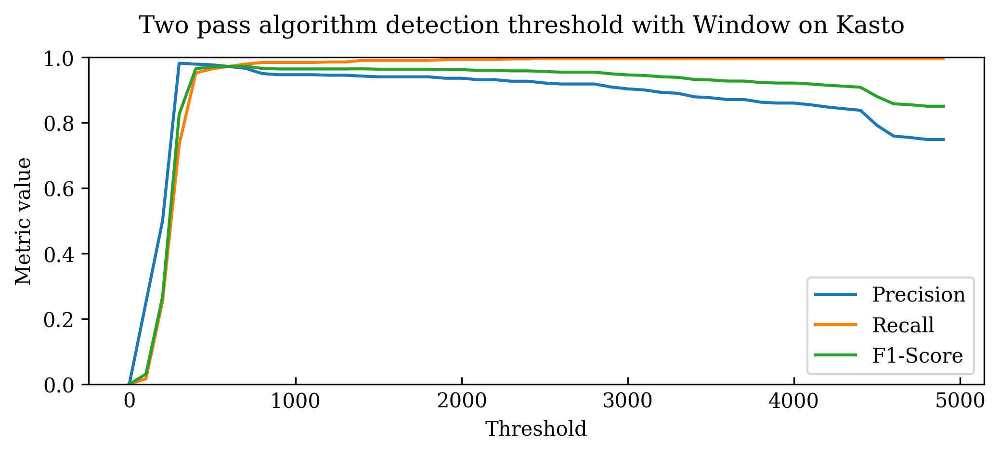

...

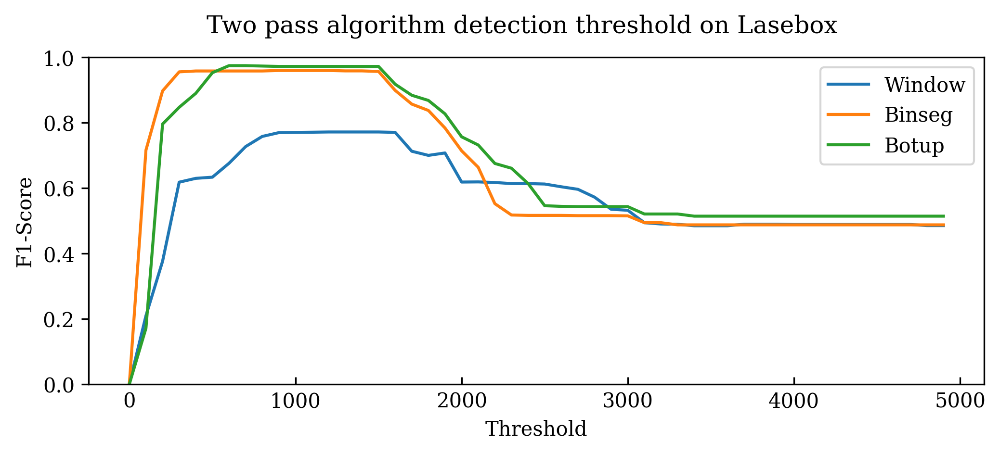

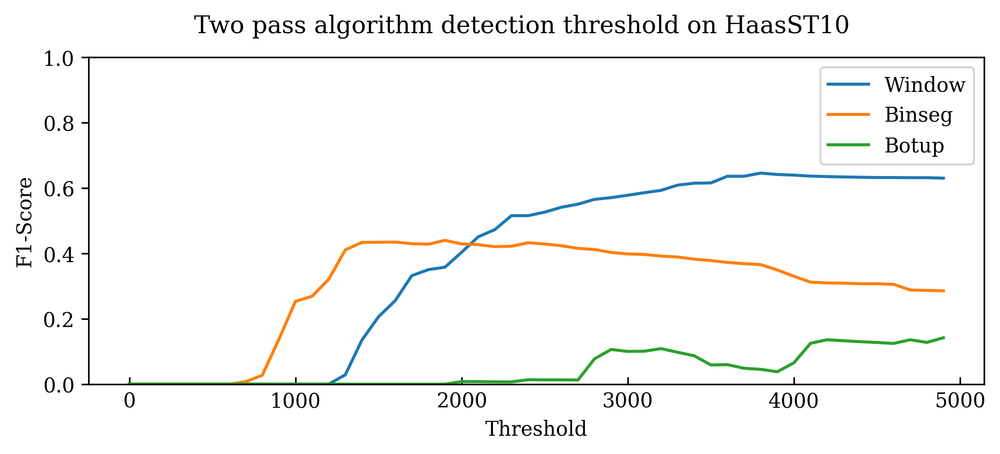

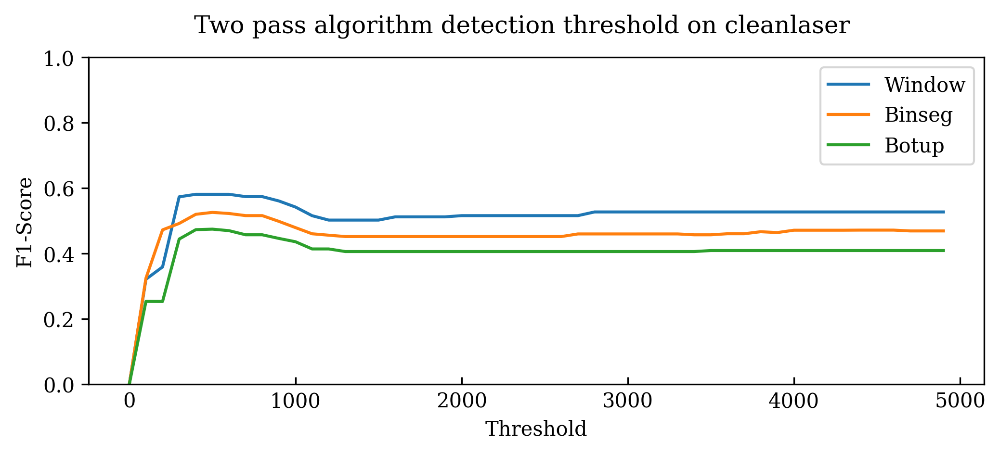

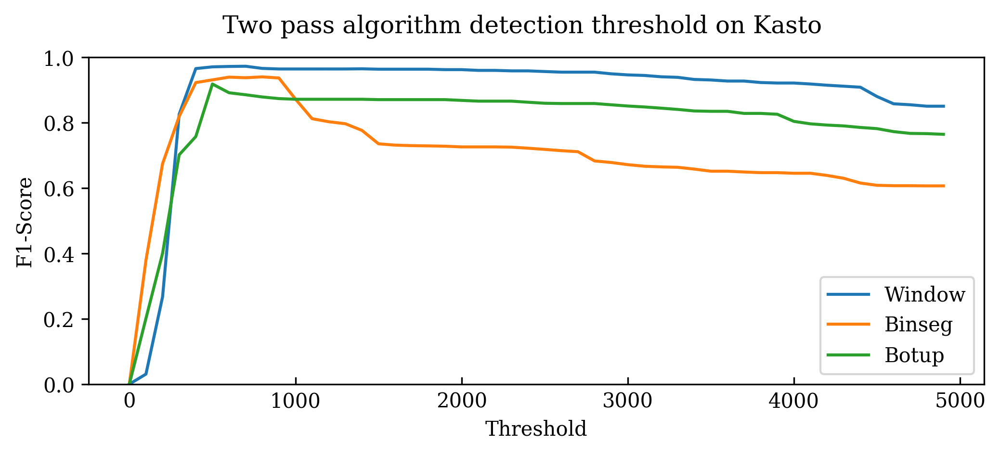

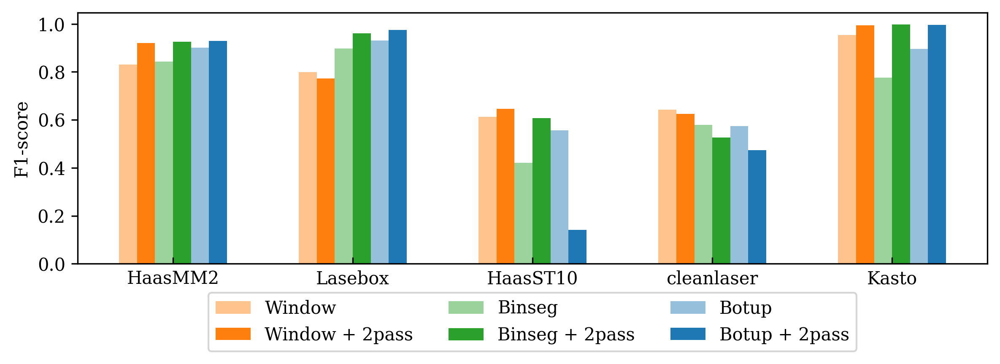

In [41]:
good_machines = ["HaasMM2", "Lasebox", "HaasST10", "cleanlaser", "Kasto"]
windows = [35, 20, 35, 35, 20]
algos = ["Window", "Binseg", "Botup"]

xres = {}

with open("outrvt/res.json", "r") as infile:
  xres = json.load(infile)

for algo in algos:
  for ix in range(len(good_machines)):
    plt.suptitle("Two pass algorithm detection threshold with " + algo + " on " + good_machines[ix])
    plt.xlabel('Threshold')
    plt.ylabel('Metric value')
    for i, metric in enumerate(["Precision", "Recall", "F1-Score"]):
      plt.plot([t * 100 for t in range(50)], [sum(xres[algo][50 * ix + x][1][i+1])/len(xres[algo][50 * ix + x][1][i+1]) if xres[algo][50 * ix + x][1][i+1] != 0 else 0 for x in range(50)], label=metric)
    plt.legend()
    plt.ylim(0,1)
    #plt.xticks(range(len(pens)), pens, rotation=45)
    plt.savefig("./outrvt/outres/" + good_machines[ix] + algo + ".png")
    plt.show()

bestthreshold = {}

for ix in range(len(good_machines)):
  bestthreshold[good_machines[ix]] = {}
  plt.suptitle("Two pass algorithm detection threshold on " + good_machines[ix])
  plt.xlabel('Threshold')
  plt.ylabel('F1-Score')
  for algo in algos:
    reducedF1 = [sum(xres[algo][50 * ix + x][1][3])/len(xres[algo][50 * ix + x][1][3]) if xres[algo][50 * ix + x][1][3] != 0 else 0 for x in range(50)]
    reducedPrec = [sum(xres[algo][50 * ix + x][1][1])/len(xres[algo][50 * ix + x][1][1]) if xres[algo][50 * ix + x][1][1] != 0 else 0 for x in range(50)]
    reducedRecall = [sum(xres[algo][50 * ix + x][1][2])/len(xres[algo][50 * ix + x][1][2]) if xres[algo][50 * ix + x][1][2] != 0 else 0 for x in range(50)]
    maxidx, elem = max(enumerate(reducedF1), key=lambda x: x[1])
    bestthreshold[good_machines[ix]][algo] = (maxidx*100, reducedF1[maxidx], reducedPrec[maxidx], reducedRecall[maxidx])
    plt.plot([t * 100 for t in range(50)], reducedF1, label=algo)
  plt.legend()
  plt.ylim(0,1)
  #plt.xticks(range(len(pens)), pens, rotation=45)
  plt.savefig("./outrvt/outres/F1score" + good_machines[ix] + ".png")
  plt.show()

with open("outrvt/outres/thresholdsMetrics.json", "w") as outfile:
  json.dump(bestthreshold, outfile)

oldres = {}

with open("out/res.json", "r") as infile:
  oldres = json.load(infile)

oldresbackup = {}

with open("backup/out/res.json", "r") as infile:
  oldresbackup = json.load(infile)

backupres = {}

with open("backup/outrvt/outres/thresholdsMetrics.json", "r") as infile:
  backupres = json.load(infile)

def choosecolor(algo):
  if algo == "Window":
    return ["#FF7F0E77"]
  elif algo == "Window + 2pass":
    return ["#FF7F0Eff"]
  elif algo == "Binseg":
    return ["#2CA02C77"]
  elif algo == "Binseg + 2pass":
    return ["#2CA02Cff"]
  elif algo == "Botup":
    return ["#1F77B477"]
  elif algo == "Botup + 2pass":
    return ["#1F77B4ff"]
  else:
    return ""

x = np.arange(len(good_machines))  # the label locations
width = 0.1  # the width of the bars

fig, ax = plt.subplots()
for ix, algo in enumerate(algos):
  f1scores = [x[0] for x in oldres[algo]]
  #f1scoresrawbackup = [x[3] for x in oldresbackup[algo]]
  f1scoresnew = []
  for machine in good_machines:
    f1scoresnew.append(max(bestthreshold[machine][algo][1], backupres[machine][algo][1]))
  f1scoresbackup = []
  for machine in good_machines:
    f1scoresbackup.append(backupres[machine][algo][1])

  #print("BACKUPf1", f1scoresbackup)
  #print("backuppens", f1scoresrawbackup)
  #print("f1", f1scoresnew)
  #print("pens", f1scores)
  rects1 = ax.bar(x + 2 * width * (ix - 1) - width/2, f1scores, width, label=algo, color=choosecolor(algo))
  rects2 = ax.bar(x + 2 * width * (ix - 1) + width/2, f1scoresnew, width, label=algo+" + 2pass", color=choosecolor(algo+" + 2pass"))
  #rects3 = ax.bar(x + 2 * width * (ix - 1) - width/2, f1scoresbackup, width, label=algo+"2passold")
  #ax.bar_label(rects1, padding=3)
  #ax.bar_label(rects2, padding=3)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('F1-score')
#ax.set_title('F1-scores by machine for each change-point algorithm')
ax.set_xticks(x)
ax.set_xticklabels(good_machines)
ax.legend(ncol=3, fancybox=True,loc="upper center", bbox_to_anchor=(0.5, -0.08))

fig.tight_layout()

plt.savefig("./outrvt/outres/F1scoreBarChart.png")
plt.show()


# Checkt the other two

In [ ]:
import json

good_machines = ["HaasMM2", "Lasebox", "HaasST10", "cleanlaser", "Kasto"]
windows = [35, 20, 35, 35, 20]
algos = ["Window", "Binseg", "Botup"]
eventModes = ["dynamic", "statick"]

oldres = {}

with open("out/res.json", "r") as infile:
  oldres = json.load(infile)

resall = {}

for algo in algos:
  resall[algo] = []

for ix in range(len(good_machines)):
  machine = good_machines[ix]
  window = windows[ix]
  f1sperAlgo = []

  for algo in algos:
    #Iterate over selection mode
    for mode in eventModes:
      try:
        metrics, precision, recall, f1score, alldeviations = metricsMachine(machine,oldres[algo][ix][3],window,"dtw",False,True,True,algo,mode,1000)
        resall[algo].append((mode, (metrics, precision, recall, f1score, alldeviations)))
      except:
        resall[algo].append((mode, (0, 0, 0, 0, 0)))
    print(algo + "DONE")

with open("outrvt/resall.json", "w") as outfile:
  json.dump(resall, outfile)

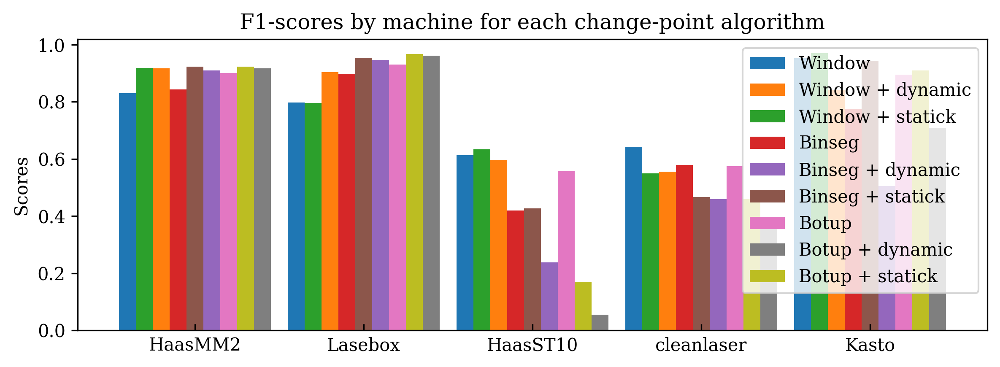

In [18]:
good_machines = ["HaasMM2", "Lasebox", "HaasST10", "cleanlaser", "Kasto"]
windows = [35, 20, 35, 35, 20]
algos = ["Window", "Binseg", "Botup"]
eventModes = ["dynamic", "statick"]

xres = {}

with open("outrvt/resall.json", "r") as infile:
  xres = json.load(infile)

bestthreshold = {}

for ix in range(len(good_machines)):
  bestthreshold[good_machines[ix]] = {}
  for algo in algos:
    bestthreshold[good_machines[ix]][algo] = {}
    for mx, mode in enumerate(eventModes):
      reducedF1 = sum(xres[algo][ix * 2 + mx][1][3])/len(xres[algo][ix * 2 + mx][1][3]) if xres[algo][ix * 2 + mx][1][3] != 0 else 0
      reducedPrec = sum(xres[algo][ix * 2 + mx][1][1])/len(xres[algo][ix * 2 + mx][1][1]) if xres[algo][ix * 2 + mx][1][1] != 0 else 0
      reducedRecall = sum(xres[algo][ix * 2 + mx][1][2])/len(xres[algo][ix * 2 + mx][1][2]) if xres[algo][ix * 2 + mx][1][2] != 0 else 0
      bestthreshold[good_machines[ix]][algo][mode] = (reducedF1, reducedPrec, reducedRecall)
      #print(reducedF1)

with open("outrvt/outresall/modeMetrics.json", "w") as outfile:
  json.dump(bestthreshold, outfile)

oldres = {}

with open("out/res.json", "r") as infile:
  oldres = json.load(infile)

x = np.arange(len(good_machines))  # the label locations
width = 0.1  # the width of the bars

fig, ax = plt.subplots()
for ix, algo in enumerate(algos):
  f1scores = [x[0] for x in oldres[algo]]
  #f1scoresrawbackup = [x[3] for x in oldresbackup[algo]]
  f1scoresnew = {}
  for mx, mode in enumerate(eventModes):
    f1scoresnew[mode] = []
    for machine in good_machines:
      f1scoresnew[mode].append(bestthreshold[machine][algo][mode][1])

  rects1 = ax.bar(x + 3 * width * (ix - 1) - width, f1scores, width, label=algo)
  rects2 = ax.bar(x + 3 * width * (ix - 1) + width, f1scoresnew["dynamic"], width, label=algo+" + dynamic")
  rects3 = ax.bar(x + 3 * width * (ix - 1), f1scoresnew["statick"], width, label=algo+" + statick")
  #ax.bar_label(rects1, padding=3)
  #ax.bar_label(rects2, padding=3)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('F1-scores by machine for each change-point algorithm')
ax.set_xticks(x)
ax.set_xticklabels(good_machines)
#ax.legend(ncol=3, fancybox=True,loc="upper center", bbox_to_anchor=(0.5, -0.1))
ax.legend()
fig.tight_layout()

plt.savefig("./outrvt/outresall/F1scoreBarChart.png")
plt.show()

# MASS threshold calculation

In [ ]:
import json

good_machines = ["HaasMM2", "Lasebox", "HaasST10", "cleanlaser", "Kasto"]
windows = [35, 20, 35, 35, 20]
algos = ["Window", "Binseg", "Botup"]

oldres = {}

with open("out/res.json", "r") as infile:
  oldres = json.load(infile)

resMass = {}

for algo in algos:
  resMass[algo] = []

for ix in range(len(good_machines)):
  machine = good_machines[ix]
  window = windows[ix]
  f1sperAlgo = []

  for algo in algos:
    #Iterate over threshold
    for t in range(50):
      print("IT " + str(t*100))
      try:
        metrics, precision, recall, f1score, alldeviations = metricsMachine(machine,oldres[algo][ix][3],window,"matrix",False,True,True,algo,"statict",t*100)
        resMass[algo].append((t*100, (metrics, precision, recall, f1score, alldeviations)))
      except:
        resMass[algo].append((t*100, (0, 0, 0, 0, 0)))
    print(algo + "DONE")

with open("outrvt/resMass.json", "w") as outfile:
  json.dump(resMass, outfile)

Starting for cleanlaser
Day: 2020 06 22
51 zu 51
51
Kept 26 out of 40
mode k: 31


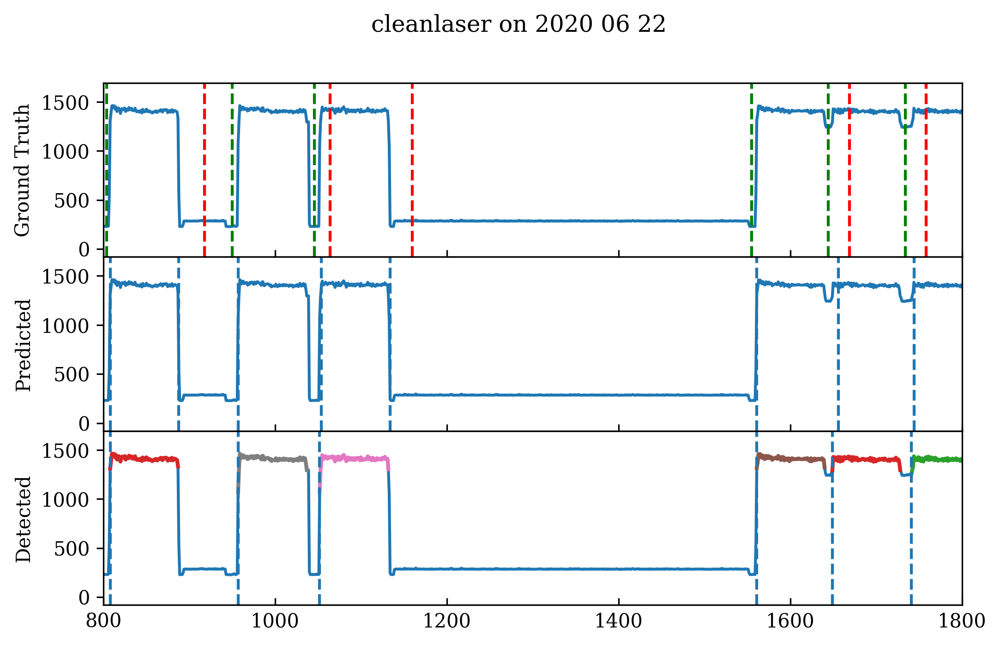

Day: 2020 06 26
40 zu 40
40
Kept 16 out of 21
mode k: 20


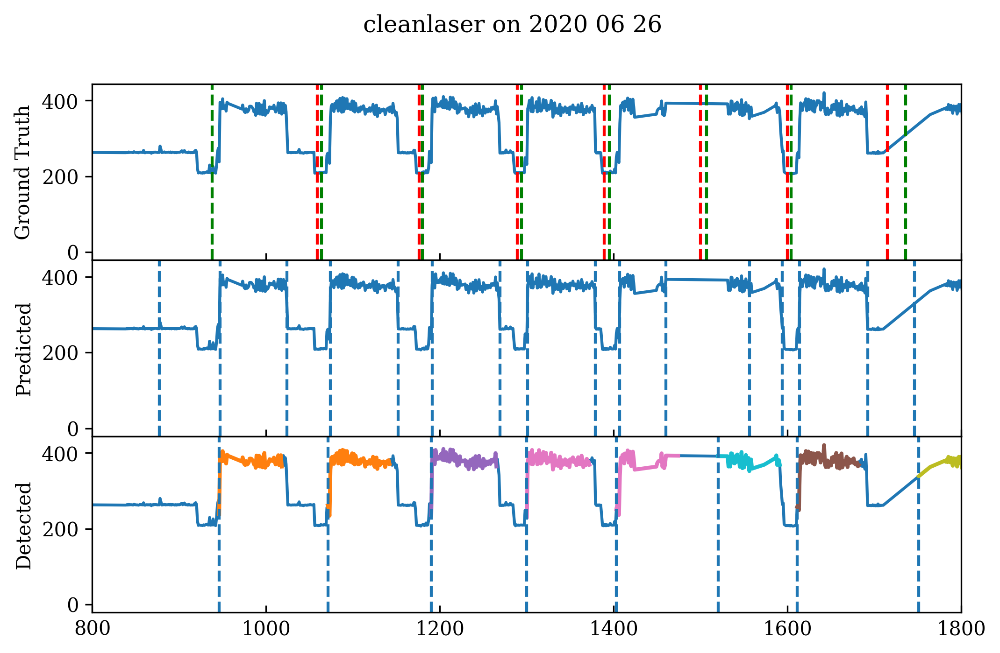

Done with cleanlaser


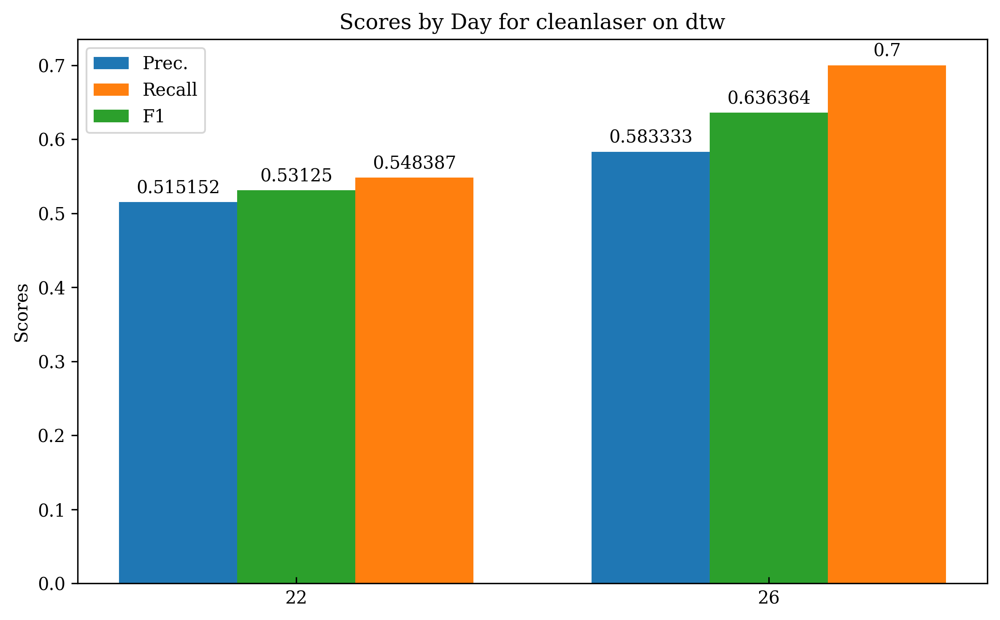

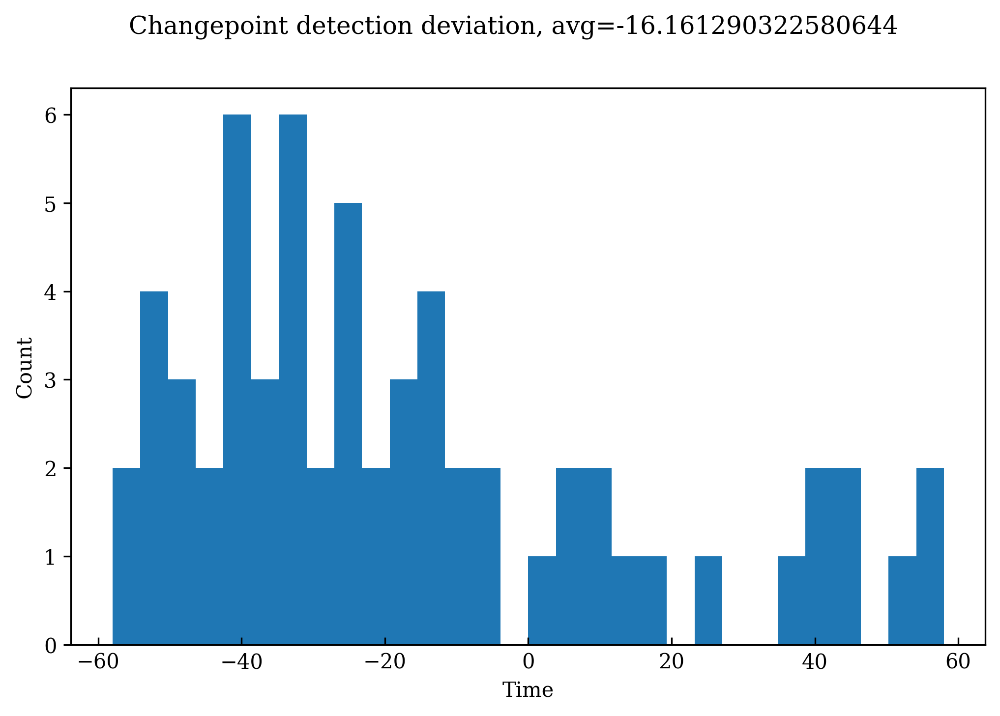

In [36]:
#metrics, precision, recall, f1score, alldeviations = metricsMachine("HaasST10",3000000,35,"dtw",True,True,True,"Botup","statict",3600, True)
#metrics, precision, recall, f1score, alldeviations = metricsMachine("Kasto",10,20,"dtw",True,True,True,"Window","statict",700)
#metrics, precision, recall, f1score, alldeviations = metricsMachine("HaasMM2",10,35,"dtw",True,True,True,"Window","statick",700)
metrics, precision, recall, f1score, alldeviations = metricsMachine("cleanlaser",10,35,"dtw",True,True,True,"Window","statick",700, True)

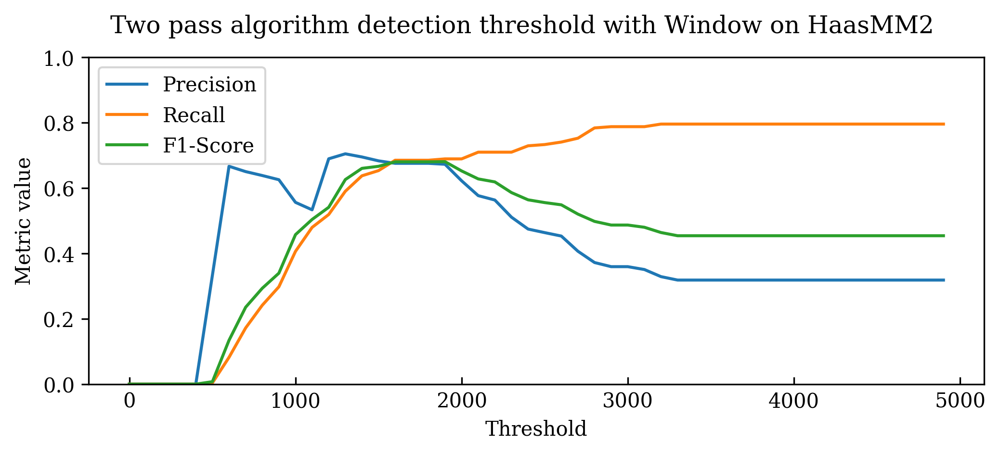

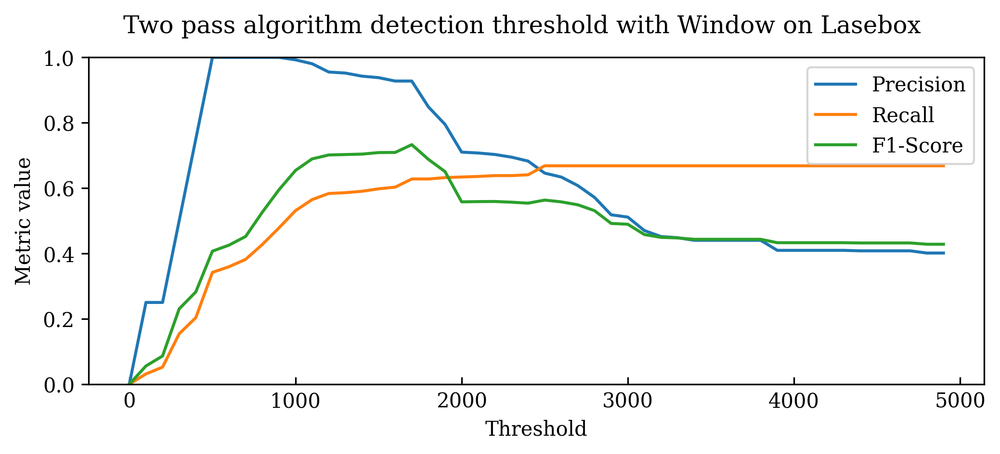

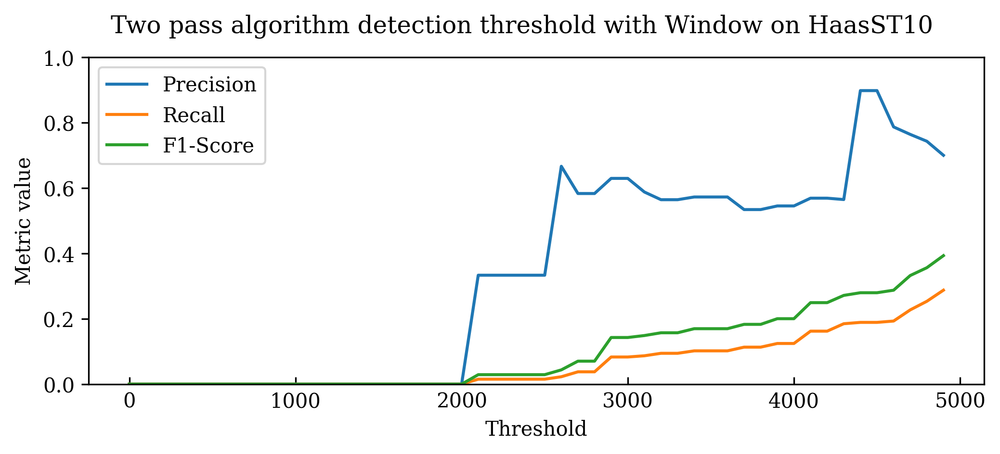

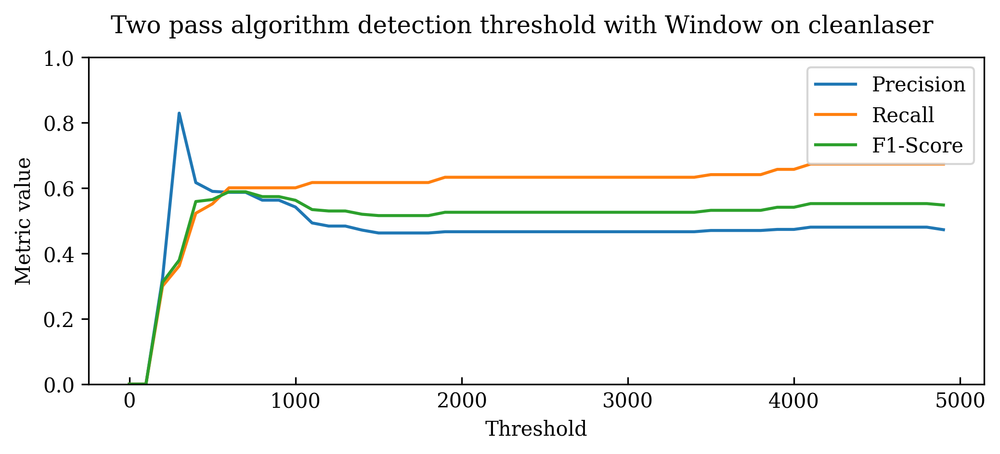

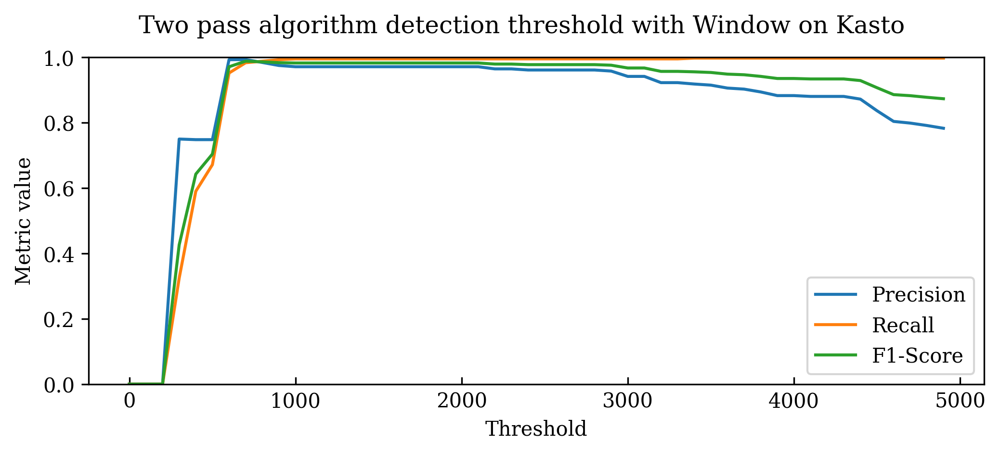

...

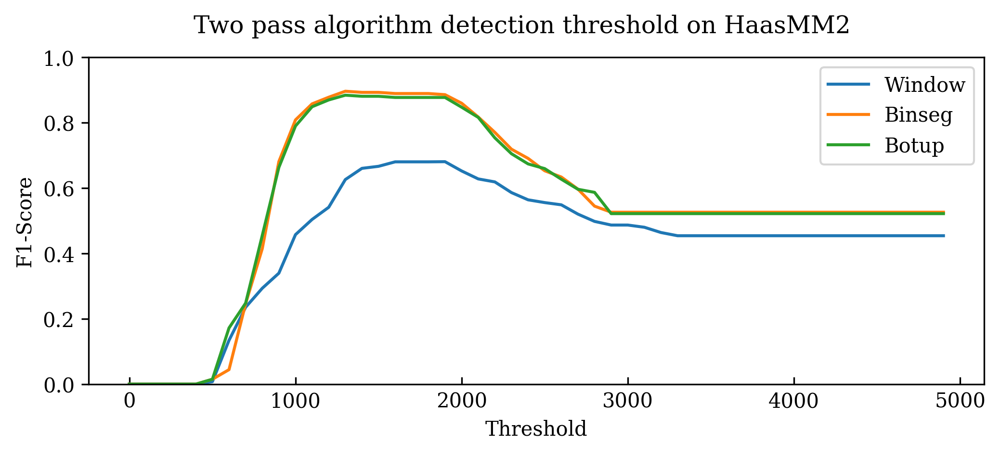

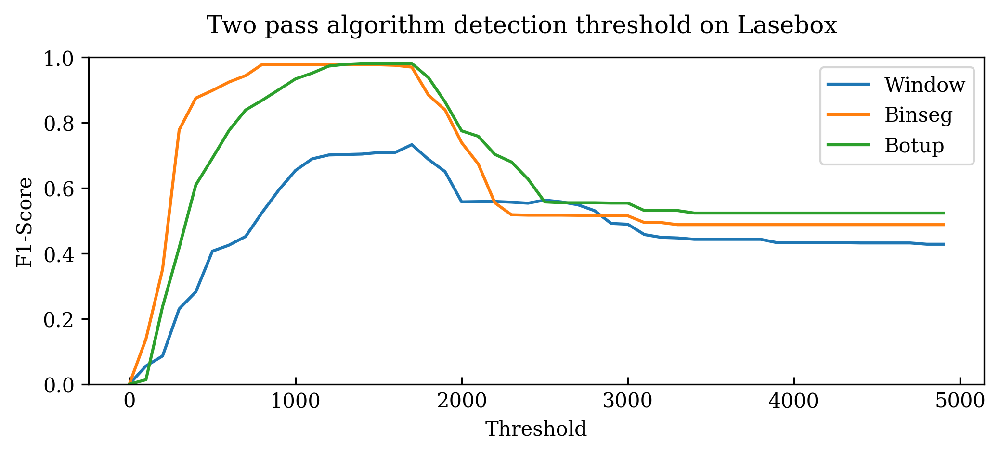

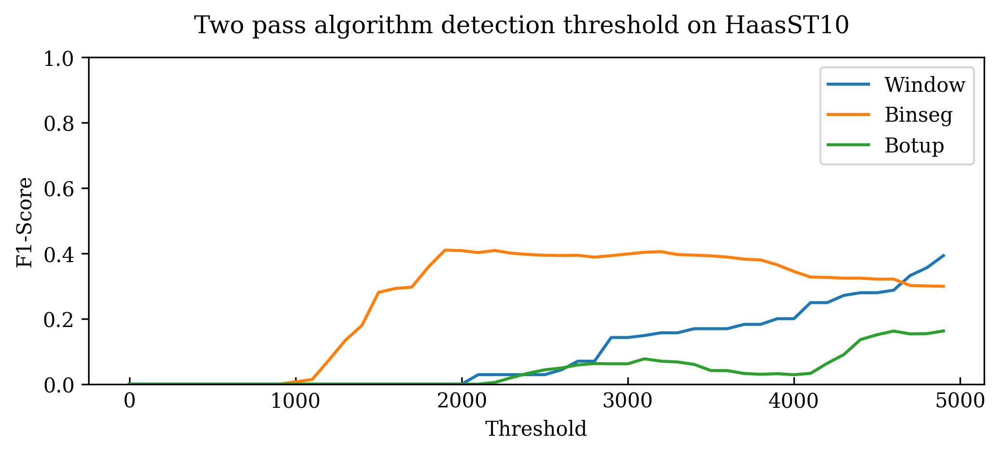

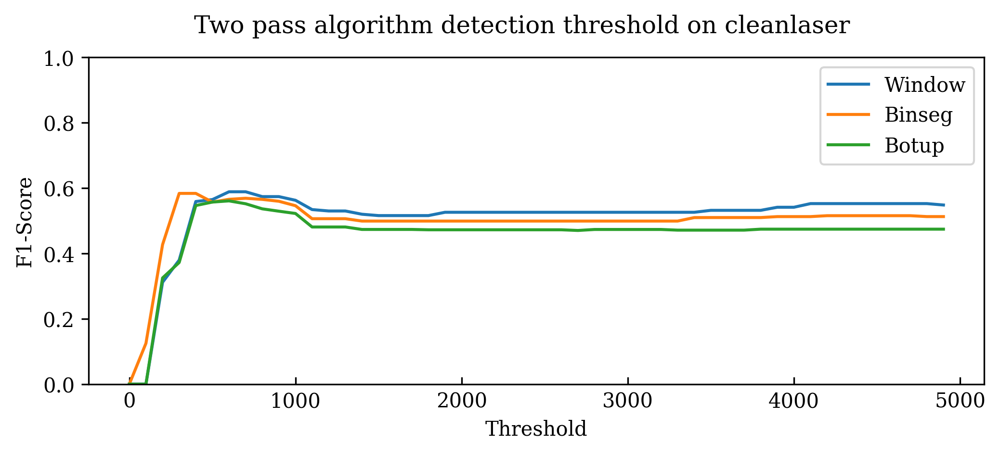

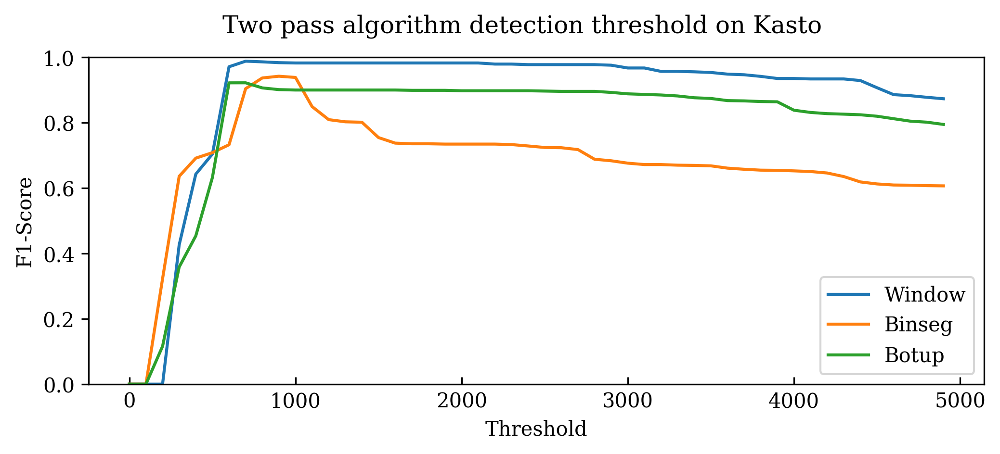

NameError: name 'backupres' is not defined

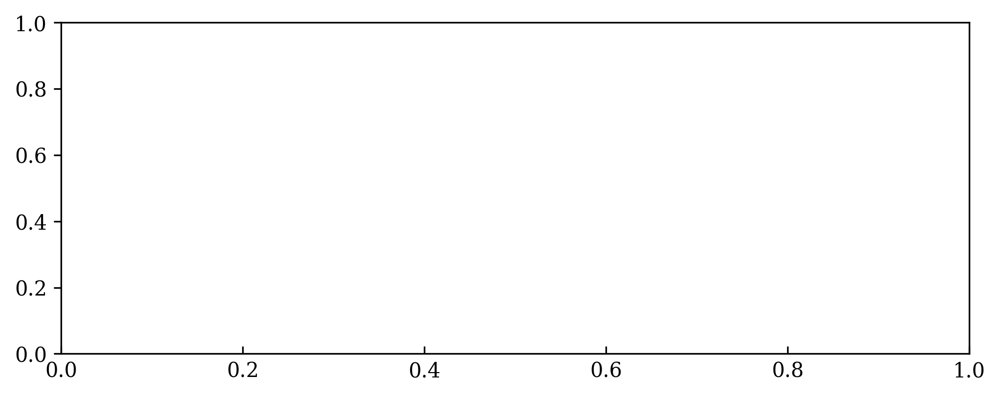

In [17]:
good_machines = ["HaasMM2", "Lasebox", "HaasST10", "cleanlaser", "Kasto"]
windows = [35, 20, 35, 35, 20]
algos = ["Window", "Binseg", "Botup"]

xres = {}

with open("outrvt/resMass.json", "r") as infile:
  xres = json.load(infile)

for algo in algos:
  for ix in range(len(good_machines)):
    plt.suptitle("Two pass algorithm detection threshold with " + algo + " on " + good_machines[ix])
    plt.xlabel('Threshold')
    plt.ylabel('Metric value')
    for i, metric in enumerate(["Precision", "Recall", "F1-Score"]):
      plt.plot([t * 100 for t in range(50)], [sum(xres[algo][50 * ix + x][1][i+1])/len(xres[algo][50 * ix + x][1][i+1]) if xres[algo][50 * ix + x][1][i+1] != 0 else 0 for x in range(50)], label=metric)
    plt.legend()
    plt.ylim(0,1)
    #plt.xticks(range(len(pens)), pens, rotation=45)
    plt.savefig("./outrvt/outresmass/" + good_machines[ix] + algo + ".png")
    plt.show()

bestthreshold = {}

for ix in range(len(good_machines)):
  bestthreshold[good_machines[ix]] = {}
  plt.suptitle("Two pass algorithm detection threshold on " + good_machines[ix])
  plt.xlabel('Threshold')
  plt.ylabel('F1-Score')
  for algo in algos:
    reducedF1 = [sum(xres[algo][50 * ix + x][1][3])/len(xres[algo][50 * ix + x][1][3]) if xres[algo][50 * ix + x][1][3] != 0 else 0 for x in range(50)]
    reducedPrec = [sum(xres[algo][50 * ix + x][1][1])/len(xres[algo][50 * ix + x][1][1]) if xres[algo][50 * ix + x][1][1] != 0 else 0 for x in range(50)]
    reducedRecall = [sum(xres[algo][50 * ix + x][1][2])/len(xres[algo][50 * ix + x][1][2]) if xres[algo][50 * ix + x][1][2] != 0 else 0 for x in range(50)]
    maxidx, elem = max(enumerate(reducedF1), key=lambda x: x[1])
    bestthreshold[good_machines[ix]][algo] = (maxidx*100, reducedF1[maxidx], reducedPrec[maxidx], reducedRecall[maxidx])
    plt.plot([t * 100 for t in range(50)], reducedF1, label=algo)
  plt.legend()
  plt.ylim(0,1)
  #plt.xticks(range(len(pens)), pens, rotation=45)
  plt.savefig("./outrvt/outresmass/F1score" + good_machines[ix] + ".png")
  plt.show()

with open("outrvt/outresmass/thresholdsMetrics.json", "w") as outfile:
  json.dump(bestthreshold, outfile)

oldres = {}

with open("out/res.json", "r") as infile:
  oldres = json.load(infile)

oldresbackup = {}

with open("backup/out/res.json", "r") as infile:
  oldresbackup = json.load(infile)

x = np.arange(len(good_machines))  # the label locations
width = 0.1  # the width of the bars

def choosecolor(algo):
  if algo == "Window":
    return ["#FF7F0E77"]
  elif algo == "Window + 2pass":
    return ["#FF7F0Eff"]
  elif algo == "Binseg":
    return ["#2CA02C77"]
  elif algo == "Binseg + 2pass":
    return ["#2CA02Cff"]
  elif algo == "Botup":
    return ["#1F77B477"]
  elif algo == "Botup + 2pass":
    return ["#1F77B4ff"]
  else:
    return ""

fig, ax = plt.subplots()
for ix, algo in enumerate(algos):
  f1scores = [x[0] for x in oldres[algo]]
  #f1scoresrawbackup = [x[3] for x in oldresbackup[algo]]
  f1scoresnew = []
  for machine in good_machines:
    f1scoresnew.append(bestthreshold[machine][algo][1])
  f1scoresbackup = []
  for machine in good_machines:
    f1scoresbackup.append(oldresbackup[machine][algo][1])

  #print("BACKUPf1", f1scoresbackup)
  #print("backuppens", f1scoresrawbackup)
  #print("f1", f1scoresnew)
  #print("pens", f1scores)
  rects1 = ax.bar(x + 2 * width * (ix - 1) - width/2, f1scores, width, label=algo, color=choosecolor(algo))
  rects2 = ax.bar(x + 2 * width * (ix - 1) + width/2, f1scoresnew, width, label=algo+" + 2pass", color=choosecolor(algo + " + 2pass"))
  #rects3 = ax.bar(x + 2 * width * (ix - 1) - width/2, f1scoresbackup, width, label=algo+"2passold")
  #ax.bar_label(rects1, padding=3)
  #ax.bar_label(rects2, padding=3)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Scores')
ax.set_title('F1-scores by machine for each change-point algorithm')
ax.set_xticks(x)
ax.set_xticklabels(good_machines)
ax.legend(ncol=3, fancybox=True,loc="upper center", bbox_to_anchor=(0.5, -0.1))

fig.tight_layout()

plt.savefig("./outrvt/outresmass/F1scoreBarChart.png")
plt.show()

# DTW Threshold calculation for window with manual penalties

In [ ]:
import json

good_machines = ["HaasMM2", "Lasebox", "HaasST10", "cleanlaser", "Kasto"]
windows = [35, 20, 35, 35, 20]
pens = [10,0,10,10,20]
algos = ["Window"]

oldres = {}

with open("out/res.json", "r") as infile:
  oldres = json.load(infile)

res = {}

for algo in algos:
  res[algo] = []

for ix in range(len(good_machines)):
  machine = good_machines[ix]
  window = windows[ix]
  f1sperAlgo = []

  for algo in algos:
    #Iterate over threshold
    for t in range(50):
      print("IT " + str(t*100))
      try:
        metrics, precision, recall, f1score, alldeviations = metricsMachine(machine,pens[ix],window,"dtw",False,True,True,algo,"statict",t*100)
        res[algo].append((t*100, (metrics, precision, recall, f1score, alldeviations)))
      except:
        print("something went wrong")
        res[algo].append((t*100, (0,0,0,0,0)))
    print(algo + "DONE")

with open("outrvt/resDTWWindow.json", "w") as outfile:
  json.dump(res, outfile)
  

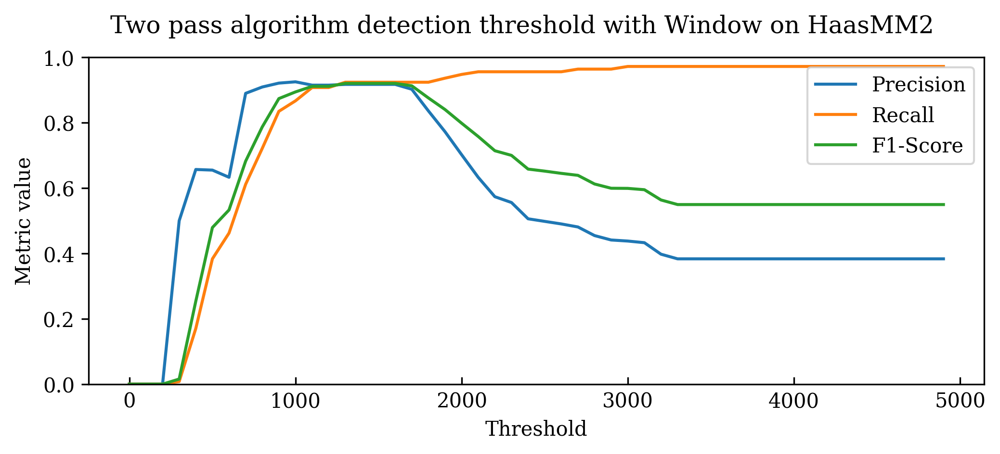

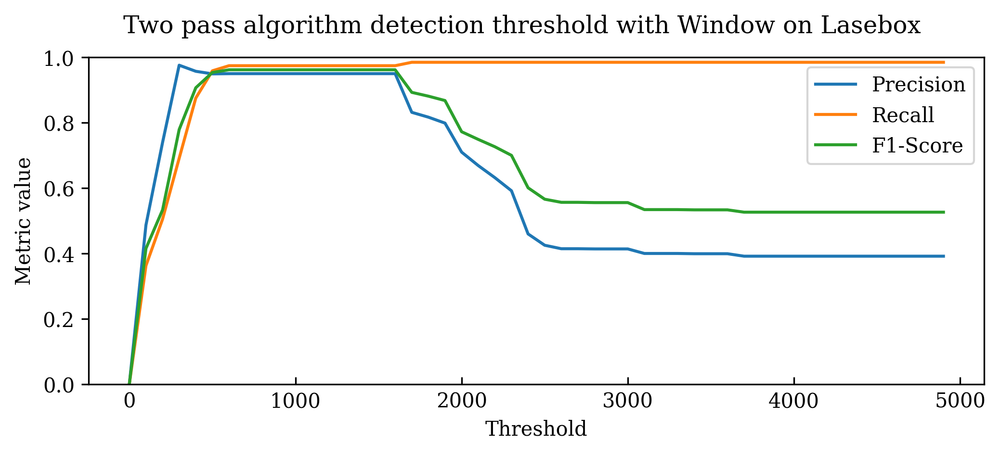

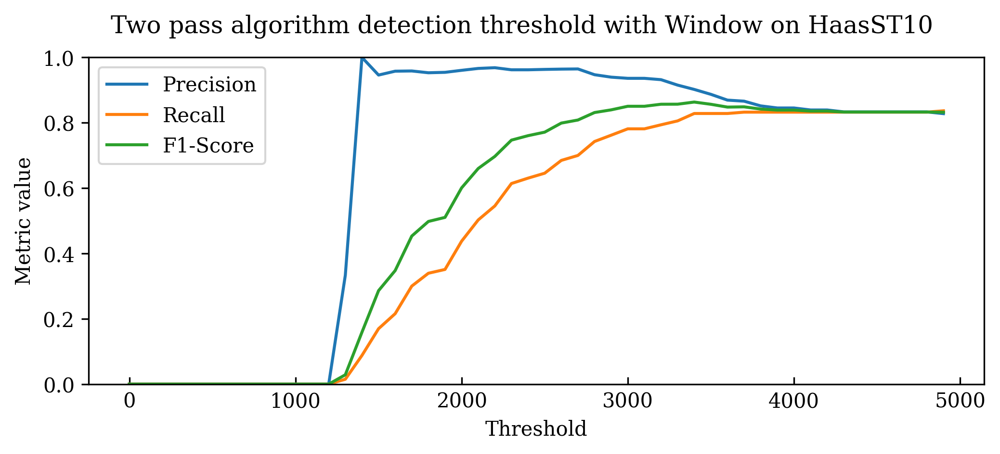

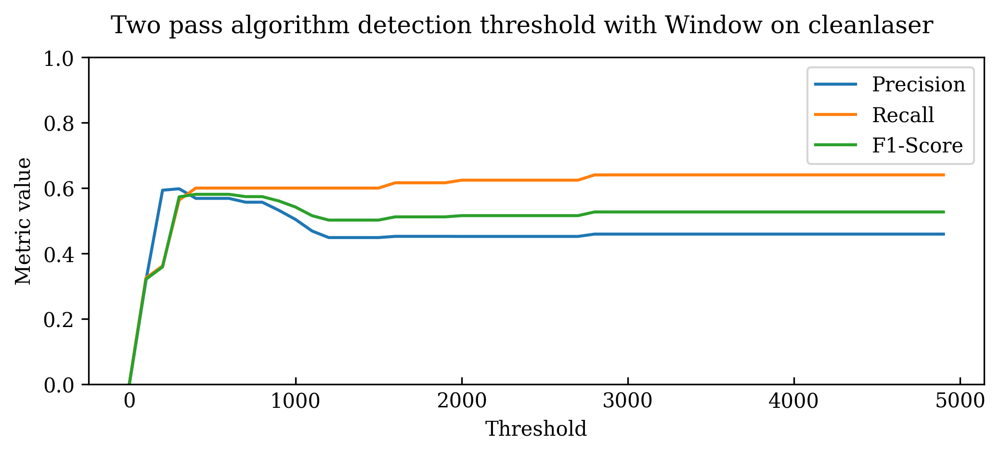

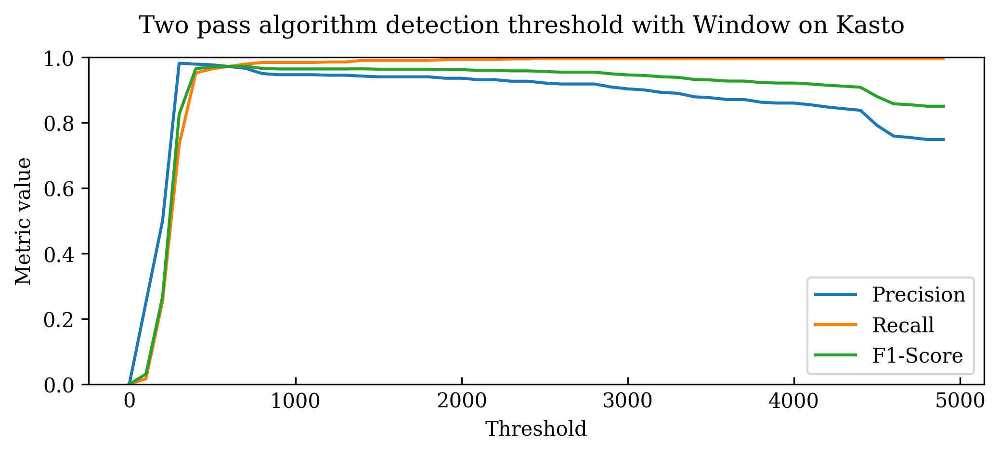

...

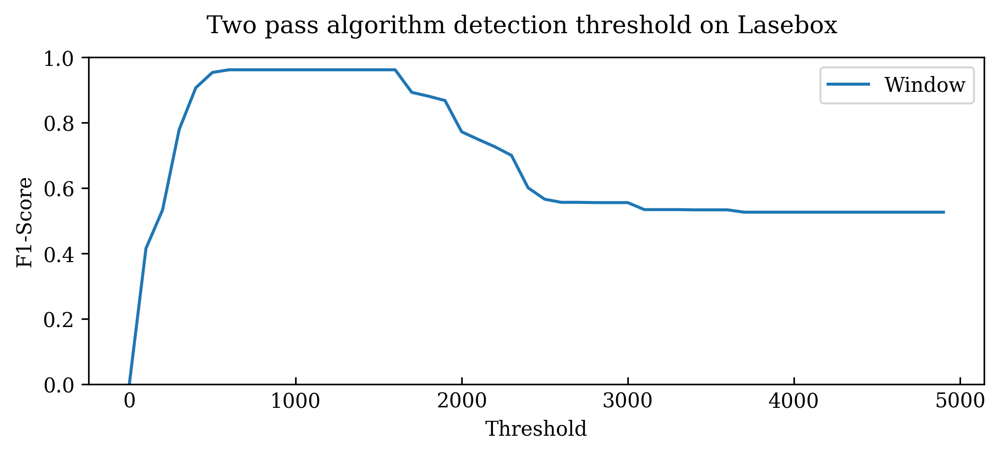

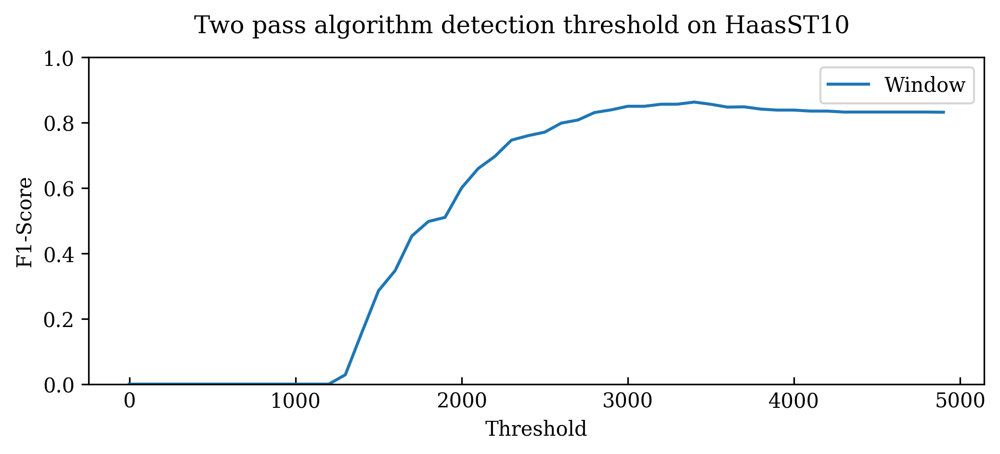

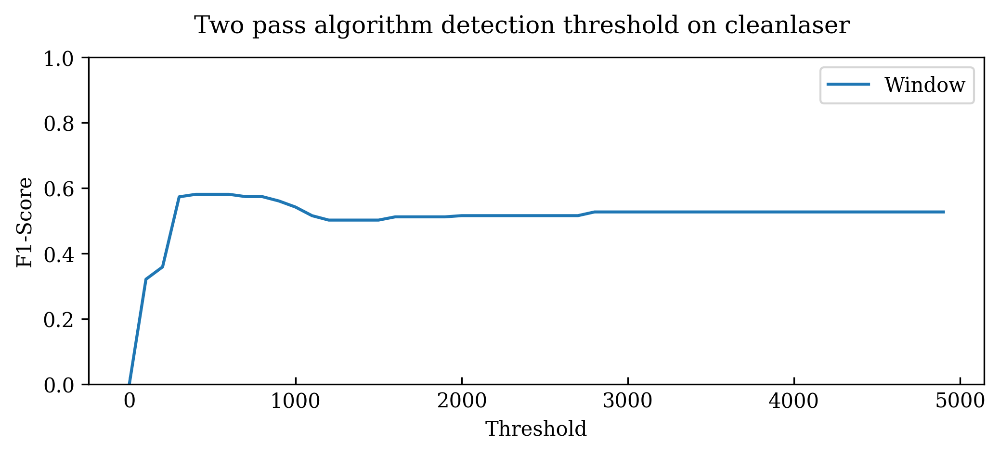

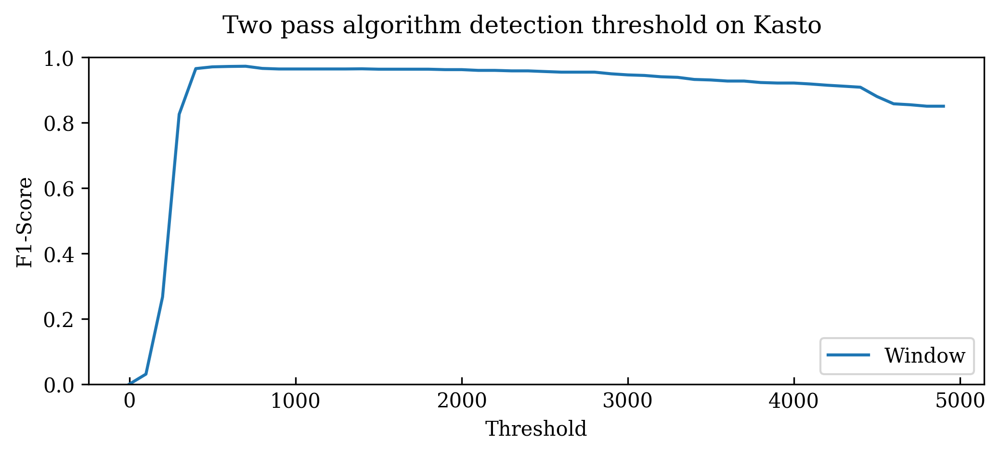

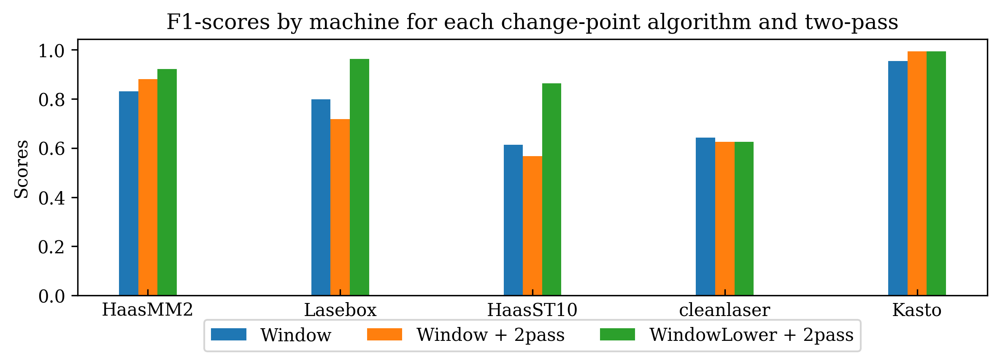

In [16]:
import json

good_machines = ["HaasMM2", "Lasebox", "HaasST10", "cleanlaser", "Kasto"]
windows = [35, 20, 35, 35, 20]
algos = ["Window"]

xres = {}

with open("outrvt/resDTWWindow.json", "r") as infile:
  xres = json.load(infile)

for algo in algos:
  for ix in range(len(good_machines)):
    plt.suptitle("Two pass algorithm detection threshold with " + algo + " on " + good_machines[ix])
    plt.xlabel('Threshold')
    plt.ylabel('Metric value')
    for i, metric in enumerate(["Precision", "Recall", "F1-Score"]):
      plt.plot([t * 100 for t in range(50)], [sum(xres[algo][50 * ix + x][1][i+1])/len(xres[algo][50 * ix + x][1][i+1]) if xres[algo][50 * ix + x][1][i+1] != 0 else 0 for x in range(50)], label=metric)
    plt.legend()
    plt.ylim(0,1)
    #plt.xticks(range(len(pens)), pens, rotation=45)
    plt.savefig("./outrvt/outresDTWWindow/" + good_machines[ix] + algo + ".png")
    plt.show()

bestthreshold = {}

for ix in range(len(good_machines)):
  bestthreshold[good_machines[ix]] = {}
  plt.suptitle("Two pass algorithm detection threshold on " + good_machines[ix])
  plt.xlabel('Threshold')
  plt.ylabel('F1-Score')
  for algo in algos:
    reducedF1 = [sum(xres[algo][50 * ix + x][1][3])/len(xres[algo][50 * ix + x][1][3]) if xres[algo][50 * ix + x][1][3] != 0 else 0 for x in range(50)]
    reducedPrec = [sum(xres[algo][50 * ix + x][1][1])/len(xres[algo][50 * ix + x][1][1]) if xres[algo][50 * ix + x][1][1] != 0 else 0 for x in range(50)]
    reducedRecall = [sum(xres[algo][50 * ix + x][1][2])/len(xres[algo][50 * ix + x][1][2]) if xres[algo][50 * ix + x][1][2] != 0 else 0 for x in range(50)]
    maxidx, elem = max(enumerate(reducedF1), key=lambda x: x[1])
    bestthreshold[good_machines[ix]][algo] = (maxidx*100, reducedF1[maxidx], reducedPrec[maxidx], reducedRecall[maxidx])
    plt.plot([t * 100 for t in range(50)], reducedF1, label=algo)
  plt.legend()
  plt.ylim(0,1)
  #plt.xticks(range(len(pens)), pens, rotation=45)
  plt.savefig("./outrvt/outresDTWWindow/F1score" + good_machines[ix] + ".png")
  plt.show()

with open("outrvt/outresDTWWindow/thresholdsMetrics.json", "w") as outfile:
  json.dump(bestthreshold, outfile)

oldres = {}

with open("out/res.json", "r") as infile:
  oldres = json.load(infile)

oldresbackup = {}

with open("backup/out/res.json", "r") as infile:
  oldresbackup = json.load(infile)

otherres = {}

with open("backup/outrvt/outres/thresholdsMetrics.json", "r") as infile:
  otherres = json.load(infile)

def choosecolor(algo):
  if algo == "Window":
    return ["#FF7F0E77"]
  elif algo == "Window + 2pass":
    return ["#FF7F0Eff"]
  elif algo == "WindowLower + 2pass":
    return ["#FF7F0Eaa"]
  elif algo == "Binseg":
    return ["#2CA02C77"]
  elif algo == "Binseg + 2pass":
    return ["#2CA02Cff"]
  elif algo == "Botup":
    return ["#1F77B477"]
  elif algo == "Botup + 2pass":
    return ["#1F77B4ff"]
  else:
    return ""

x = np.arange(len(good_machines))  # the label locations
width = 0.1  # the width of the bars

fig, ax = plt.subplots()
for ix, algo in enumerate(algos):
  f1scores = [x[0] for x in oldres[algo]]
  #f1scoresrawbackup = [x[3] for x in oldresbackup[algo]]
  f1scoresnew = []
  for machine in good_machines:
    f1scoresnew.append(max(bestthreshold[machine][algo][1],otherres[machine][algo][1]))
  f1scoresother = []
  for machine in good_machines:
    f1scoresother.append(otherres[machine][algo][1])

  #print("BACKUPf1", f1scoresbackup)
  #print("backuppens", f1scoresrawbackup)
  #print("f1", f1scoresnew)
  #print("pens", f1scores)
  rects1 = ax.bar(x - width, f1scores, width, label=algo)#, color=choosecolor(algo))
  rects2 = ax.bar(x, f1scoresother, width, label=algo+" + 2pass")#, color=choosecolor(algo+"Lower + 2pass"))
  rects3 = ax.bar(x + width, f1scoresnew, width, label=algo+"Lower + 2pass")#, color=choosecolor(algo+" + 2pass"))
  #rects3 = ax.bar(x + 2 * width * (ix - 1) - width/2, f1scoresbackup, width, label=algo+"2passold")
  #ax.bar_label(rects1, padding=3)
  #ax.bar_label(rects2, padding=3)

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('F1-score')
#ax.set_title('F1-scores by machine for each change-point algorithm and two-pass')
ax.set_xticks(x)
ax.set_xticklabels(good_machines)
ax.legend(ncol=3, fancybox=True,loc="upper center", bbox_to_anchor=(0.5, -0.06))

fig.tight_layout()

plt.savefig("./outrvt/outresDTWWindow/F1scoreBarChart.png")
plt.show()

# Other two for lower penalties

In [11]:
import json

good_machines = ["HaasMM2", "Lasebox", "HaasST10", "cleanlaser", "Kasto"]
windows = [35, 20, 35, 35, 20]
pens = [10,0,10,10,20]
algos = ["Window"]
eventModes = ["dynamic", "statick"]

resall = {}

for algo in algos:
  resall[algo] = []

for ix in range(len(good_machines)):
  machine = good_machines[ix]
  window = windows[ix]
  f1sperAlgo = []

  for algo in algos:
    #Iterate over selection mode
    for mode in eventModes:
      try:
        metrics, precision, recall, f1score, alldeviations = metricsMachine(machine,pens[ix],window,"dtw",False,True,True,algo,mode,1000)
        resall[algo].append((mode, (metrics, precision, recall, f1score, alldeviations)))
      except:
        print("SOMETHING WENT WRONG")
        resall[algo].append((mode, (0, 0, 0, 0, 0)))


bestthreshold = {}

for ix in range(len(good_machines)):
  bestthreshold[good_machines[ix]] = {}
  for algo in algos:
    bestthreshold[good_machines[ix]][algo] = {}
    for mx, mode in enumerate(eventModes):
      reducedF1 = sum(resall[algo][ix * 2 + mx][1][3])/len(resall[algo][ix * 2 + mx][1][3]) if resall[algo][ix * 2 + mx][1][3] != 0 else 0
      reducedPrec = sum(resall[algo][ix * 2 + mx][1][1])/len(resall[algo][ix * 2 + mx][1][1]) if resall[algo][ix * 2 + mx][1][1] != 0 else 0
      reducedRecall = sum(resall[algo][ix * 2 + mx][1][2])/len(resall[algo][ix * 2 + mx][1][2]) if resall[algo][ix * 2 + mx][1][2] != 0 else 0
      bestthreshold[good_machines[ix]][algo][mode] = (reducedF1, reducedPrec, reducedRecall)

with open("outrvt/outresallDTWWindow/modeMetrics.json", "w") as outfile:
  json.dump(bestthreshold, outfile)

Starting for HaasMM2
Day: 2020 06 22
51 zu 51
51
Kept 20 out of 22


../src\twopass.py:191: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  kmeans = cluster.KMeans(n_clusters=2, random_state=0).fit(np.array(list(zip(filtidxtosim, filtidxtoavg))))


Day: 2020 06 25
106 zu 106
106
Kept 45 out of 48


../src\twopass.py:191: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  kmeans = cluster.KMeans(n_clusters=2, random_state=0).fit(np.array(list(zip(filtidxtosim, filtidxtoavg))))


Day: 2020 06 24
104 zu 104
104
Kept 41 out of 42


../src\twopass.py:191: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  kmeans = cluster.KMeans(n_clusters=2, random_state=0).fit(np.array(list(zip(filtidxtosim, filtidxtoavg))))


Done with HaasMM2
Starting for HaasMM2
Day: 2020 06 22
51 zu 51
51
Kept 20 out of 22
mode k: 21
Day: 2020 06 25
106 zu 106
106
Kept 45 out of 48
mode k: 41
Day: 2020 06 24
104 zu 104
104
Kept 41 out of 42
mode k: 44
Done with HaasMM2
WindowDONE
Starting for Lasebox
Day: 2020 06 25
209 zu 209
209
Kept 78 out of 83


../src\twopass.py:191: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  kmeans = cluster.KMeans(n_clusters=2, random_state=0).fit(np.array(list(zip(filtidxtosim, filtidxtoavg))))


Day: 2020 06 22
77 zu 77
77
Kept 10 out of 12


../src\twopass.py:191: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  kmeans = cluster.KMeans(n_clusters=2, random_state=0).fit(np.array(list(zip(filtidxtosim, filtidxtoavg))))


Day: 2020 06 24
182 zu 182
182
Kept 47 out of 54


../src\twopass.py:191: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  kmeans = cluster.KMeans(n_clusters=2, random_state=0).fit(np.array(list(zip(filtidxtosim, filtidxtoavg))))
../src\twopass.py:191: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  kmeans = cluster.KMeans(n_clusters=2, random_state=0).fit(np.array(list(zip(filtidxtosim, filtidxtoavg))))


Day: 2020 06 26
11 zu 11
11
Kept 8 out of 10
Done with Lasebox
Starting for Lasebox
Day: 2020 06 25
209 zu 209
209
Kept 78 out of 83
mode k: 72
Day: 2020 06 22
77 zu 77
77
Kept 10 out of 12
mode k: 12
Day: 2020 06 24
182 zu 182
182
Kept 47 out of 54
mode k: 50
Day: 2020 06 26
11 zu 11
11
Kept 8 out of 10
mode k: 10
Done with Lasebox
WindowDONE
Starting for HaasST10
Day: 2020 06 22
48 zu 48
48
Kept 21 out of 25


../src\twopass.py:191: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  kmeans = cluster.KMeans(n_clusters=2, random_state=0).fit(np.array(list(zip(filtidxtosim, filtidxtoavg))))


Day: 2020 06 25
90 zu 90
90
Kept 43 out of 65


../src\twopass.py:191: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  kmeans = cluster.KMeans(n_clusters=2, random_state=0).fit(np.array(list(zip(filtidxtosim, filtidxtoavg))))


Day: 2020 06 24
74 zu 74
74
Kept 38 out of 54


../src\twopass.py:191: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  kmeans = cluster.KMeans(n_clusters=2, random_state=0).fit(np.array(list(zip(filtidxtosim, filtidxtoavg))))


Done with HaasST10
Starting for HaasST10
Day: 2020 06 22
48 zu 48
48
Kept 21 out of 25
mode k: 22
Day: 2020 06 25
90 zu 90
90
Kept 43 out of 65
mode k: 41
Day: 2020 06 24
74 zu 74
74
Kept 38 out of 54
mode k: 45
Done with HaasST10
WindowDONE
Starting for cleanlaser
Day: 2020 06 22
51 zu 51
51
Kept 26 out of 40


../src\twopass.py:191: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  kmeans = cluster.KMeans(n_clusters=2, random_state=0).fit(np.array(list(zip(filtidxtosim, filtidxtoavg))))


Day: 2020 06 26
40 zu 40
40
Kept 16 out of 21


../src\twopass.py:191: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  kmeans = cluster.KMeans(n_clusters=2, random_state=0).fit(np.array(list(zip(filtidxtosim, filtidxtoavg))))


Done with cleanlaser
Starting for cleanlaser
Day: 2020 06 22
51 zu 51
51
Kept 26 out of 40
mode k: 31
Day: 2020 06 26
40 zu 40
40
Kept 16 out of 21
mode k: 20
Done with cleanlaser
WindowDONE
Starting for Kasto
Day: 2020 06 22
110 zu 110
110
Kept 82 out of 92


../src\twopass.py:191: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  kmeans = cluster.KMeans(n_clusters=2, random_state=0).fit(np.array(list(zip(filtidxtosim, filtidxtoavg))))


Day: 2020 06 25
161 zu 161
161
Kept 130 out of 144


../src\twopass.py:191: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  kmeans = cluster.KMeans(n_clusters=2, random_state=0).fit(np.array(list(zip(filtidxtosim, filtidxtoavg))))


Day: 2020 06 24
144 zu 144
144
Kept 116 out of 131


../src\twopass.py:191: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  kmeans = cluster.KMeans(n_clusters=2, random_state=0).fit(np.array(list(zip(filtidxtosim, filtidxtoavg))))


Day: 2020 06 23
121 zu 121
121
Kept 52 out of 101


../src\twopass.py:191: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  kmeans = cluster.KMeans(n_clusters=2, random_state=0).fit(np.array(list(zip(filtidxtosim, filtidxtoavg))))


Done with Kasto
Starting for Kasto
Day: 2020 06 22
110 zu 110
110
Kept 82 out of 92
mode k: 53
Day: 2020 06 25
161 zu 161
161
Kept 130 out of 144
mode k: 77
Day: 2020 06 24
144 zu 144
144
Kept 116 out of 131
mode k: 70
Day: 2020 06 23
121 zu 121
121
Kept 52 out of 101
mode k: 54
Done with Kasto
WindowDONE


# Matrix Threshold calculation for window with manual penalties

In [ ]:
import json

good_machines = ["HaasMM2", "Lasebox", "HaasST10", "cleanlaser", "Kasto"]
windows = [35, 20, 35, 35, 20]
pens = [10,0,10,10,10]
algos = ["Window"]

oldres = {}

with open("out/res.json", "r") as infile:
  oldres = json.load(infile)

resMass = {}

for algo in algos:
  resMass[algo] = []

for ix in range(len(good_machines)):
  machine = good_machines[ix]
  window = windows[ix]
  f1sperAlgo = []

  for algo in algos:
    #Iterate over threshold
    for t in range(50):
      print("IT " + str(t*100))
      try:
        metrics, precision, recall, f1score, alldeviations = metricsMachine(machine,pens[ix],window,"matrix",False,True,True,algo,"statict",t*100)
        resMass[algo].append((t*100, (metrics, precision, recall, f1score, alldeviations)))
      except:
        resMass[algo].append((t*100, (0, 0, 0, 0, 0)))
    print(algo + "DONE")

with open("outrvt/resMassWindow.json", "w") as outfile:
  json.dump(resMass, outfile)

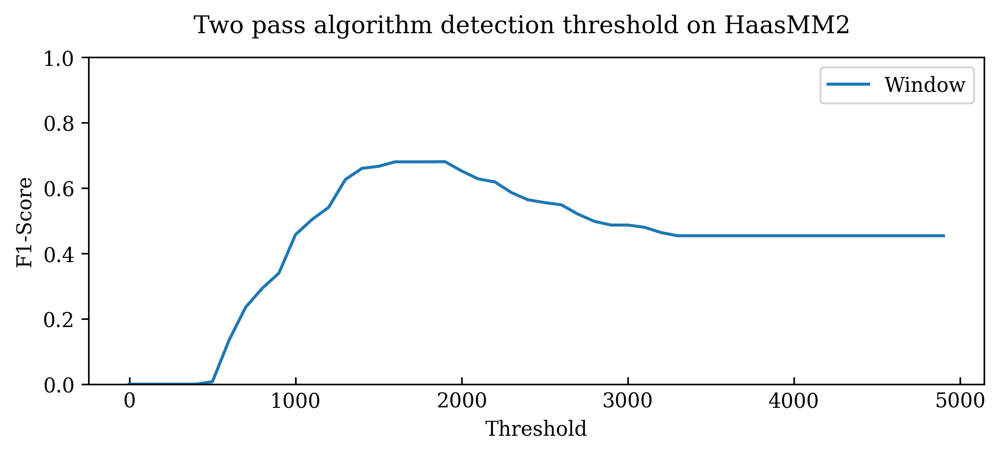

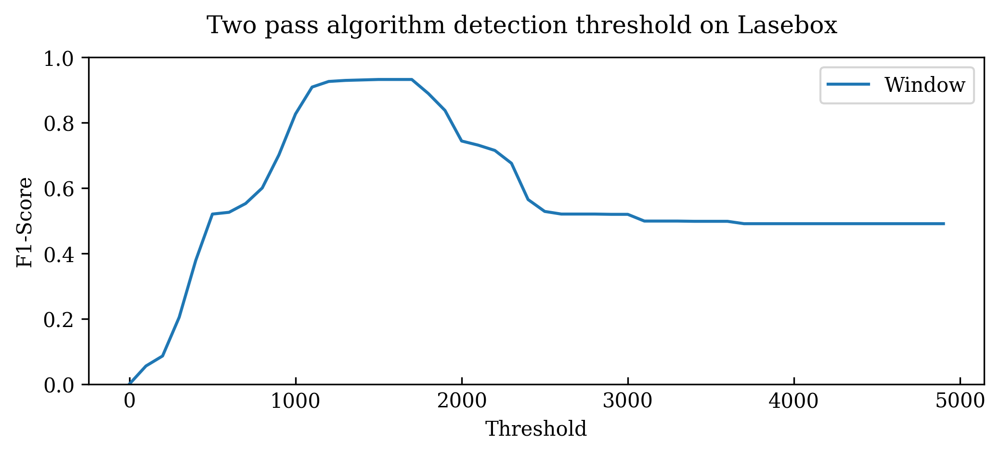

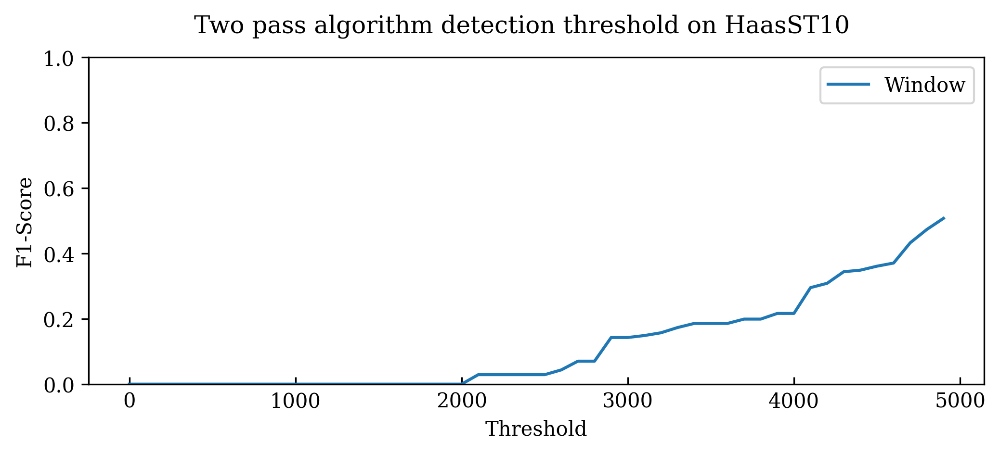

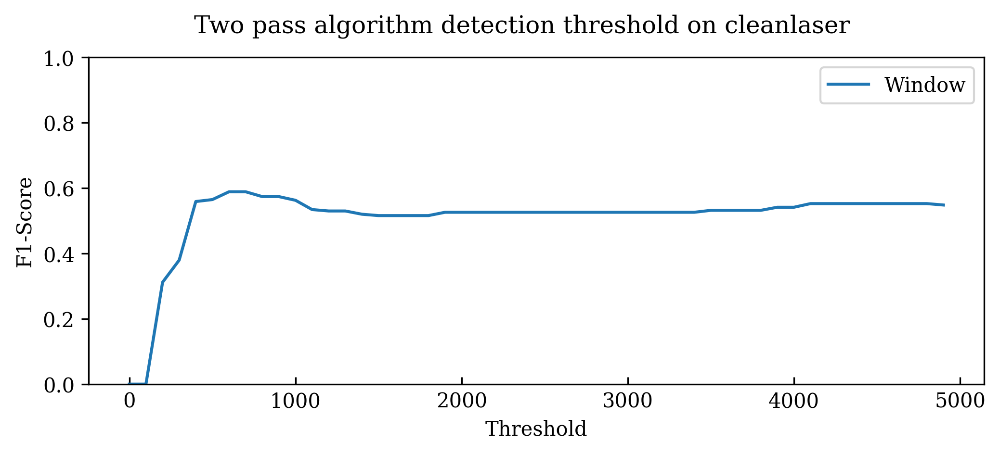

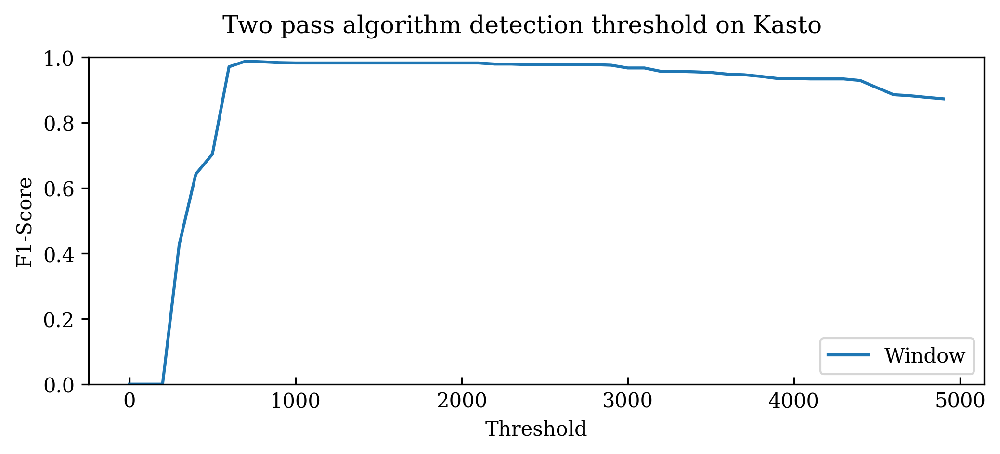

In [5]:
import json

good_machines = ["HaasMM2", "Lasebox", "HaasST10", "cleanlaser", "Kasto"]
windows = [35, 20, 35, 35, 20]
algos = ["Window"]

xres = {}

with open("outrvt/resMassWindow.json", "r") as infile:
  xres = json.load(infile)

bestthreshold = {}

for ix in range(len(good_machines)):
  bestthreshold[good_machines[ix]] = {}
  plt.suptitle("Two pass algorithm detection threshold on " + good_machines[ix])
  plt.xlabel('Threshold')
  plt.ylabel('F1-Score')
  for algo in algos:
    reducedF1 = [sum(xres[algo][50 * ix + x][1][3])/len(xres[algo][50 * ix + x][1][3]) if xres[algo][50 * ix + x][1][3] != 0 else 0 for x in range(50)]
    reducedPrec = [sum(xres[algo][50 * ix + x][1][1])/len(xres[algo][50 * ix + x][1][1]) if xres[algo][50 * ix + x][1][1] != 0 else 0 for x in range(50)]
    reducedRecall = [sum(xres[algo][50 * ix + x][1][2])/len(xres[algo][50 * ix + x][1][2]) if xres[algo][50 * ix + x][1][2] != 0 else 0 for x in range(50)]
    maxidx, elem = max(enumerate(reducedF1), key=lambda x: x[1])
    bestthreshold[good_machines[ix]][algo] = (maxidx*100, reducedF1[maxidx], reducedPrec[maxidx], reducedRecall[maxidx])
    plt.plot([t * 100 for t in range(50)], reducedF1, label=algo)
  plt.legend()
  plt.ylim(0,1)
  #plt.xticks(range(len(pens)), pens, rotation=45)
  plt.savefig("./outrvt/outresMassWindow/F1score" + good_machines[ix] + ".png")
  plt.show()

with open("outrvt/outresMassWindow/thresholdsMetrics.json", "w") as outfile:
  json.dump(bestthreshold, outfile)

# Combined

In [14]:
good_machines = ["HaasMM2", "Lasebox", "HaasST10", "cleanlaser", "Kasto"]
windows = [35, 20, 35, 35, 20]
pens = [10,0,10,10,10]
algos = ["Window", "Binseg", "Botup"]

resCP = {}
with open("out/res.json", "r") as infile:
  resCP = json.load(infile)

resT = {}
with open("outrvt/outres/thresholdsMetrics.json", "r") as infile:
  resT = json.load(infile)

resAll = {}
with open("outrvt/outresall/modeMetrics.json", "r") as infile:
  resAll = json.load(infile)

resWindow = {}
with open("outrvt/outresDTWWindow/thresholdsMetrics.json", "r") as infile:
  resWindow = json.load(infile)

resAllWindow = {}
with open("outrvt/outresallDTWWindow/modeMetrics.json", "r") as infile:
  resAllWindow = json.load(infile)

blank = {}
statict = {}
statick = {}
dynamic = {}

for algo in algos:
  blank[algo] = 0
  statict[algo] = 0
  statick[algo] = 0
  dynamic[algo] = 0
  for ix in range(len(good_machines)):
    blank[algo] += resCP[algo][ix][0]
    statict[algo] += resT[good_machines[ix]][algo][1]
    statick[algo] += resAll[good_machines[ix]][algo]["statick"][0]
    dynamic[algo] += resAll[good_machines[ix]][algo]["dynamic"][0]

  blank[algo]/=len(good_machines)
  statict[algo]/=len(good_machines)
  statick[algo]/=len(good_machines)
  dynamic[algo]/=len(good_machines)

# FOR Better DTW with lower window size

statict["newWindow"] = 0
statick["newWindow"] = 0
dynamic["newWindow"] = 0
for ix in range(len(good_machines)):
  statict["newWindow"] += resWindow[good_machines[ix]]["Window"][1]
  statick["newWindow"] += resAllWindow[good_machines[ix]]["Window"]["statick"][0]
  dynamic["newWindow"] += resAllWindow[good_machines[ix]]["Window"]["dynamic"][0]

statict["newWindow"]/=len(good_machines)
statick["newWindow"]/=len(good_machines)
dynamic["newWindow"]/=len(good_machines)



print("blank", blank)
print("statict", statict)
print("statick", statick)
print("dynamic", dynamic)

blank {'Window': 0.7674926752001363, 'Binseg': 0.7032918990205441, 'Botup': 0.7713645793689703}
statict {'Window': 0.7782907552529572, 'Binseg': 0.7580318008666767, 'Botup': 0.6875163852869335, 'newWindow': 0.8598367738794804}
statick {'Window': 0.770883253161897, 'Binseg': 0.7393976208687252, 'Botup': 0.6896128061691208, 'newWindow': 0.8497542017873296}
dynamic {'Window': 0.7615679304224199, 'Binseg': 0.6907821910720962, 'Botup': 0.6570436569753374, 'newWindow': 0.8391708207240771}
